In [3]:
using  OrdinaryDiffEq, LinearAlgebra, ForwardDiff, Plots, NBInclude; gr()
@nbinclude("IntegratorTools.ipynb");

# Kepler invariants

In [53]:
H(q,p) = norm(p)^2/2 - inv(norm(q));
H(z) = H(z[1:3],z[4:6]);
L(q,p) = cross(q,p)
L(z) = L(z[1:3],z[4:6]);

function Invariants(H,L,u)
errH = H(u[:,1]) .-H.(eachcol(u))
errL = Ref(L(u[:,1])) .- L.(eachcol(u))

return  norm.(errH), norm.(errL)
end

Invariants (generic function with 1 method)

In [92]:
function Kepler3d!(ydot,y,p,t)
 ydot[1] = y[4]
 ydot[2] = y[5]
 ydot[3] = y[6]
 ydot[4] = -y[1]/(y[1]^2+y[2]^2+y[3]^2)^(3/2)
 ydot[5] = -y[2]/(y[1]^2+y[2]^2+y[3]^2)^(3/2)
 ydot[6] = -y[3]/(y[1]^2+y[2]^2+y[3]^2)^(3/2)  
end

y₀ = [0.8 ; 0.6 ; 0 ; 0 ; 1 ; 0.5]
tspan = (0.0,10.0)
prob = ODEProblem(Kepler3d!,y₀,tspan)
sol = solve(prob,Vern7(),reltol=1e-12,abstol=1e-12)

uExact = stack(sol.u, dims=2)

plot_orbit(uExact) = plot(uExact[1,:],uExact[2,:],uExact[3,:], label="exact" ,xlabel = "q1", ylabel = "q2", zlabel = "q3",lw=2,lc=:black)

#plot3d(u_exact[1,:],u_exact[2,:],u_exact[3,:],xlabel = L"q_1", ylabel = L"q_2", zlabel = L"q_3")

plot_orbit(uExact)

function plot_orbit(H, L, uExact,uNum)
p = plot(uExact[1,:],uExact[2,:],uExact[3,:], label="exact" ,xlabel = "q1", ylabel = "q2", zlabel = "q3",lw=2,lc=:black)
plot!(p,uNum[1,:],uNum[2,:],uNum[3,:])
end

function plot_first_integrals(H, L, uNum,t)
  plot(t,Invariants(H,L,uNum)[1], lab=["Energy variation" "Angular momentum variation"])
    plot!(t,Invariants(H,L,uNum)[2], lab="Angular momentum variation")
end

plot_first_integrals (generic function with 3 methods)

# Kepler Numerical Experiements - Dynamics and Invariants

In [77]:
function fKepler(u) # fKepler := Kepler vector field
r = norm(u[1:3])^3;
return udot = [u[4] ; u[5]; u[6] ; -u[1]/r; -u[2]/r; -u[3]/r];
end

function fKeplerT(p) # fKeplerT := vector field to Kinetic energy
    
return Qdot = [p[1] ; p[2] ; p[3]];

end


function fKeplerV(q) # fKeplerV := vector field to potentioal energy
    
r = norm(q)^3;
    
return Pdot = [-q[1]/r , -q[2]/r , -q[3]/r];
    
end

u₀ = [0.8 , 0.6 , 0 , 0 , 1 , 0.5]; q₀=[u₀[1], u₀[2], u₀[3]];  p₀=[u₀[4], u₀[5], u₀[6]]; 

h=0.005;  t=100 ;  N=Int(t/h);  ts = (0:N) * h; 

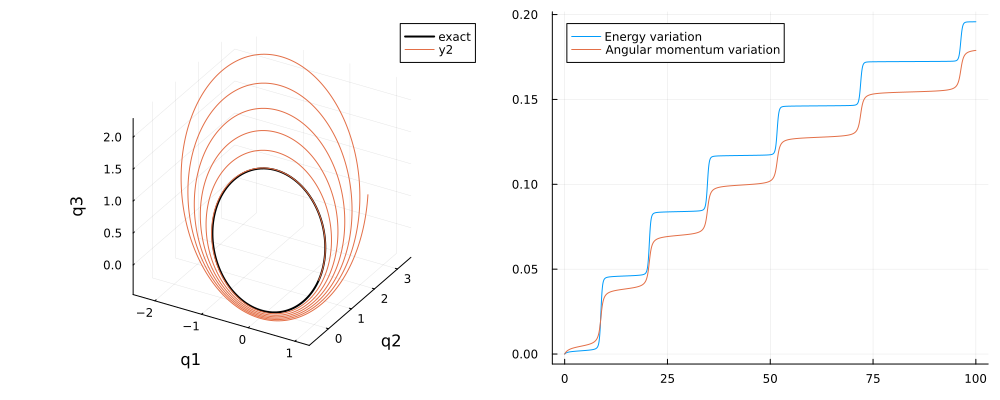

In [197]:
uExpEuler = ExpEuler(fKepler,u₀,h,N)

gr(size=(1000,400));


p1 = plot_orbit(uExact,uExpEuler)

p2  = plot_first_integrals(H, L, uExpEuler,ts)

#l = @layout [grid(1,2,widths=[1/2,1/2],heights=[3/4,1/4])]


plot(p1,p2)

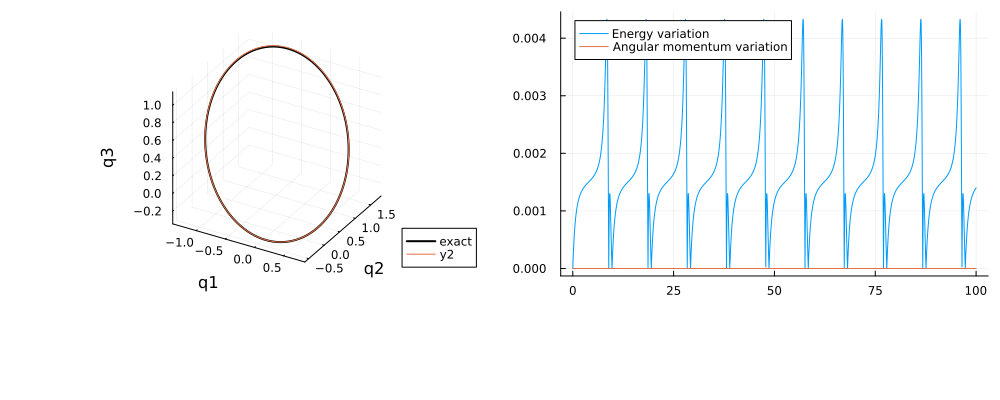

In [198]:
uSympEuler = SympEuler(fKeplerT,fKeplerV,q₀,p₀,h,N)

p1 = plot_orbit(uExact,uSympEuler)

p2  = plot_first_integrals(H, L, uSympEuler,ts)

l = @layout [grid(1,2,widths=[1/2,1/2],heights=[3/4,1/4])]

plot(p1,p2,layout=l)

In [ ]:
h=0.05;  t=10 ;  N=Int(t/h);  ts = (0:N) * h; 


uImpEuler = ImpEuler(fKepler,u₀,h,N)


p1 = plot_orbit(uExact,uImpEuler)

p2  = plot_first_integrals(H, L, uImpEuler,ts)

#l = @layout [grid(1,2,widths=[1/2,1/2],heights=[3/4,1/4])]

plot(p1,p2)

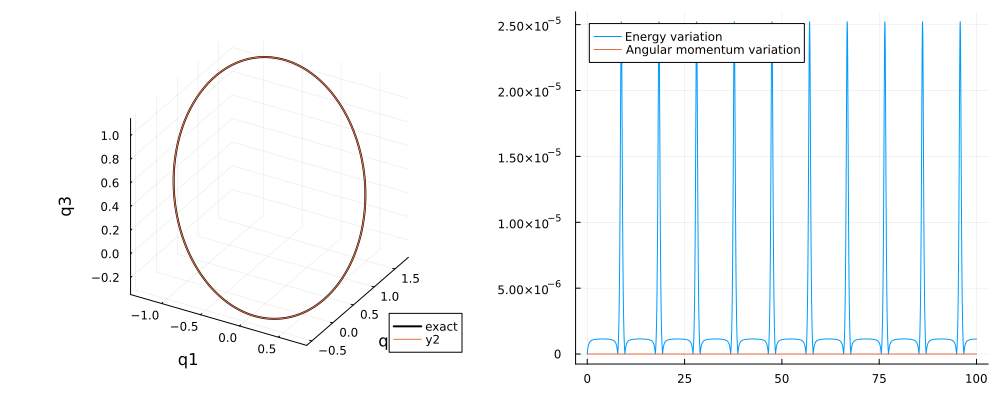

In [203]:
uMidPoint = MidPoint(fKepler,u₀,h,N)


p1 = plot_orbit(uExact,uMidPoint)

p2  = plot_first_integrals(H, L, uMidPoint,ts)

#l = @layout [grid(1,2,widths=[1/2,1/2],heights=[3/4,1/4])]

plot(p1,p2)




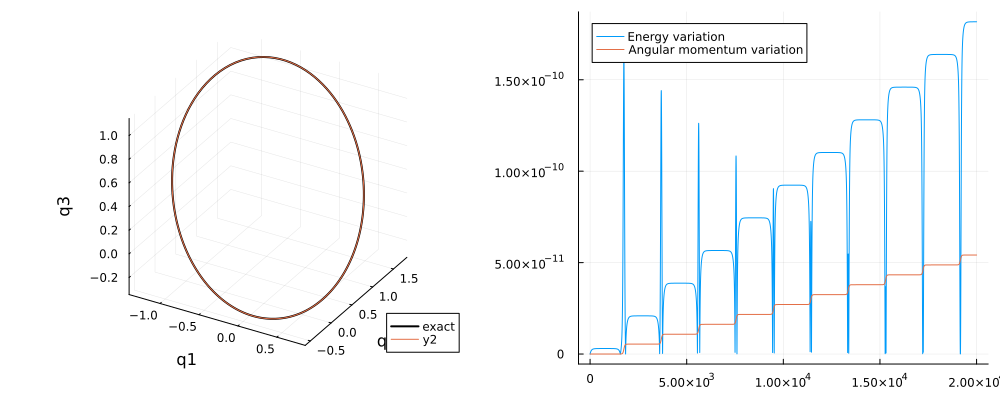

In [204]:
uRK4 = RK4(fKepler,u₀,h,N)


p1 = plot_orbit(uExact,uRK4)

p2  = plot_first_integrals(H, L, uRK4)

#l = @layout [grid(1,2,widths=[1/2,1/2],heights=[3/4,1/4])]

plot(p1,p2)


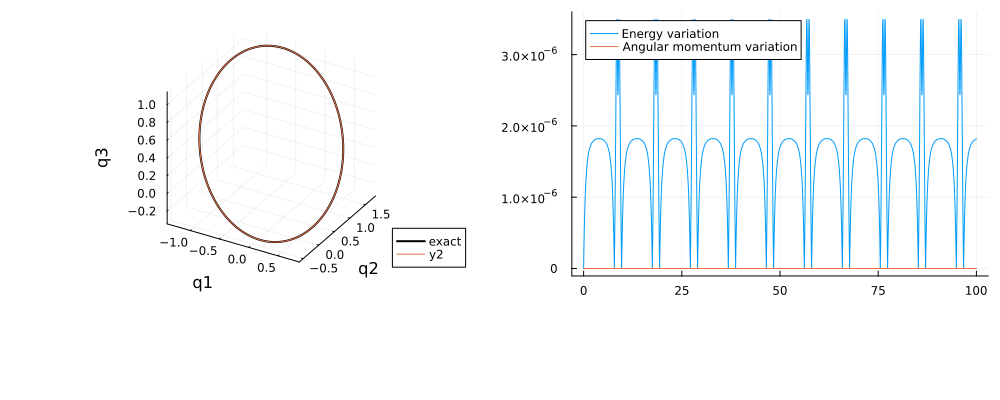

In [205]:
uStoVer = StormerVerlet(fKeplerT,fKeplerV,q₀,p₀,h,N)

p1 = plot_orbit(uExact,uStoVer)

p2  = plot_first_integrals(H, L, uStoVer,ts)

l = @layout [grid(1,2,widths=[1/2,1/2],heights=[3/4,1/4])]

plot(p1,p2,layout=l)

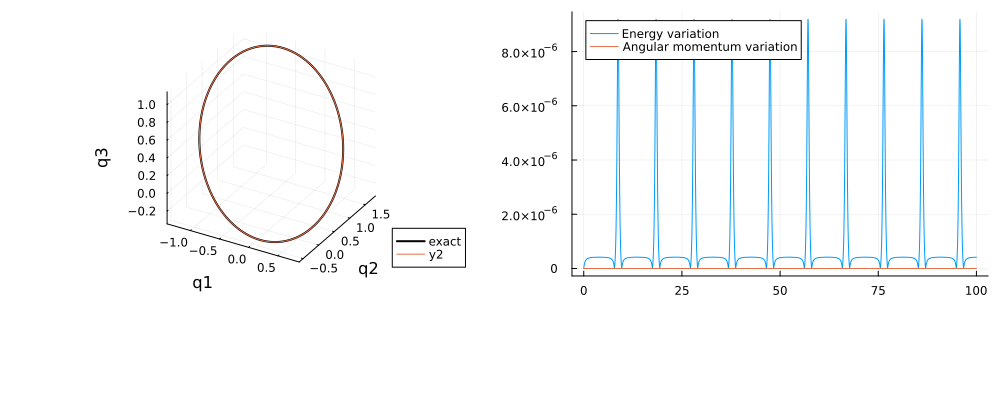

In [208]:
a = (2+ 2^(1/2) + 1/2^(1/3)) / 3;
    
A = [a/2 0 0; a 1/2-a 0; a 1-2*a a/2];

b = [a, 1-2*a, a] ;

uSRK = ImpRK(fKepler,u₀,A,b,h,N)

p1 = plot_orbit(uExact,uSRK)

p2  = plot_first_integrals(H, L, uSRK,ts)

l = @layout [grid(1,2,widths=[1/2,1/2],heights=[3/4,1/4])]

plot(p1,p2,layout=l)

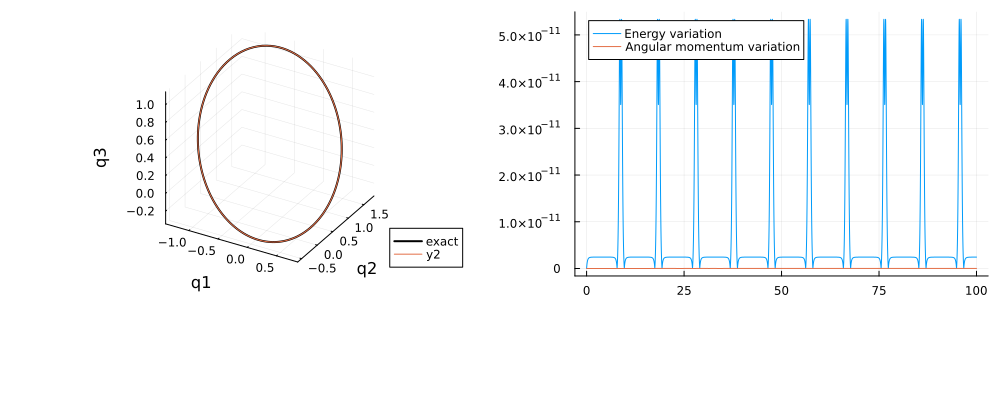

In [209]:
A = [0.25 0.25-√3/6 ; 0.25+√3/6 0.25]

b = [0.5, 0.5] ;


uGauss = ImpRK(fKepler,u₀,A,b,h,N)

p1 = plot_orbit(uExact,uGauss )

p2  = plot_first_integrals(H, L, uGauss ,ts)

l = @layout [grid(1,2,widths=[1/2,1/2],heights=[3/4,1/4])]

plot(p1,p2,layout=l)